In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [ ]:
def fourier_transform(image):
  ft = np.fft.fft2(image)
  ft = np.fft.fftshift(ft)

  return ft

Original image


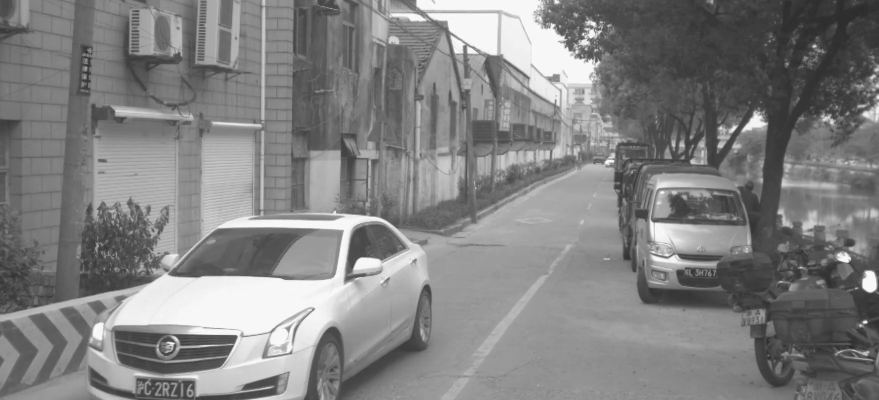

Shifted fourier transform of image


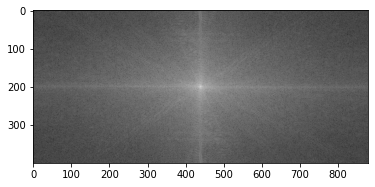

In [ ]:
img = cv2.imread('right_camera_view.jpg', cv2.IMREAD_GRAYSCALE)
print("Original image")
cv2_imshow(img)

ft_image = fourier_transform(img)
enhanced_ft_image = np.log1p(np.abs(ft_image))
print("Shifted fourier transform of image")
plt.imshow(enhanced_ft_image, cmap='gray')
plt.show()

Ideal Low Pass Filter

A frequency domain low pass filter satisfiying the property : 
H(u, v) = {1 if D(u, v) >= D0, 0 if D(U, v) < D0) \
Here, D(u, v) is given by sqrt((u - M / 2) ** 2 + (v - N / 2) ** 2) \
D0 is the cutoff frequency of the image (or the radius of the circle encompassing the low frequency componenets of frequency domain image). \
Blurs image, but produces significant blurring.

In [ ]:
img_shape = img.shape

def ideal_low_pass_filter(image, d0):
  m, n = image.shape
  
  H = np.zeros((m, n), dtype=np.float32)
  for u in range(m):
    for v in range(n):
      d = np.sqrt((u - m / 2)**2 + (v - n / 2) ** 2)
      if d <= d0:
        # Inside the allowed - frequency range
        H[u, v] = 1
      else:
        H[u, v] = 0
  
  return H

Ideal High Pass Filter

A frequency domain filter given by 1 - Ideal Low Pass Filter \

That is, H(u, v) = {0 if D(u, v) >= D0, 1 if D(u, v) < D0} \
Here, D0 is the cutoff frequency, or the frequencies we wish to attenutate.

In [ ]:
def ideal_high_pass_filter(image, d0):
  m, n = image.shape

  H = np.zeros((m, n), dtype=np.float32)
  for u in range(m):
    for v in range(n):
      d = np.sqrt((u - m / 2)**2 + (v - n / 2) ** 2)
      if d <= d0:
        # Inside not  allowed - frequency range
        H[u, v] = 0
      else:
        H[u, v] = 1
  
  return H

Visualizing the Ideal Low Pass Filter and Ideal High Pass Filter

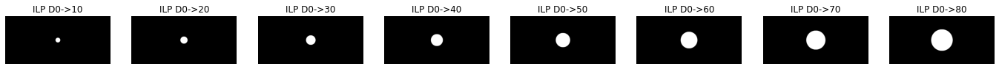

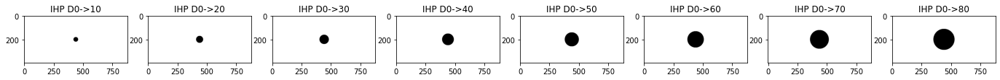

In [ ]:
ilp_filters = []
for i in range(1, 10):
  ilp_filters.append(ideal_low_pass_filter(img, i * 10))

ihp_filters = []
for i in range(1, 10):
  ihp_filters.append(ideal_high_pass_filter(img, i * 10))

plt.figure(figsize=(30,5))

for i in range(1, 9):
  plt.subplot(1,10, i)
  plt.imshow(ilp_filters[i],cmap='gray')
  plt.title(('ILP D0->' + str(i * 10)))
  plt.axis('off')

plt.show()

plt.figure(figsize=(30,5))

for i in range(1, 9):
  plt.subplot(2,10, i)
  plt.imshow(ihp_filters[i],cmap='gray')
  plt.title(('IHP D0->' + str(i * 10)))
  plt.axis('on')


plt.show()

Applying the low pass & high pass ideal pass filters : Multiply frequency domain of image by the filter, and de - center (i.e shift it), and perform inverse fourier transform of the image.

In [ ]:
# Assume iamge is in spatial domain
def apply_low_pass_filter(ilp_filter, image):
  ft = np.fft.fft2(image)
  ft_shifted = np.fft.fftshift(ft)

  g = ft_shifted * ilp_filter

  g_spatial = np.fft.ifftshift(g)
  g_spatial = np.fft.ifft2(g_spatial)

  return g, g_spatial

<Figure size 2160x360 with 0 Axes>

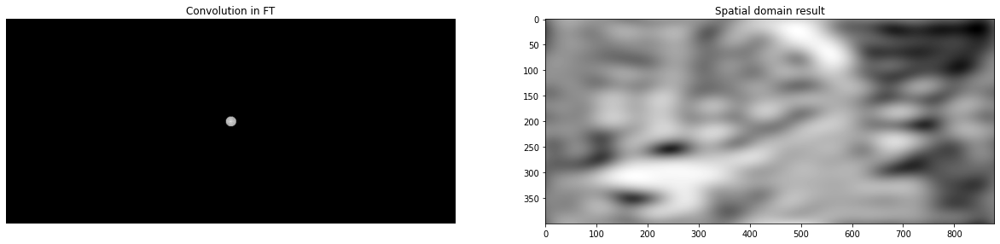

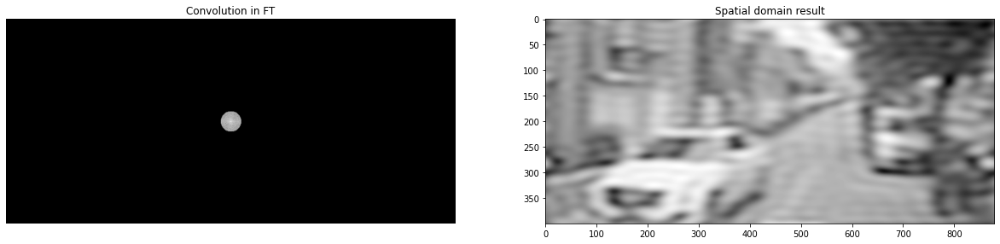

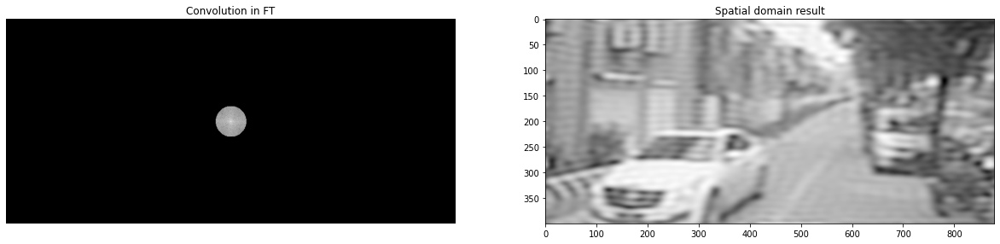

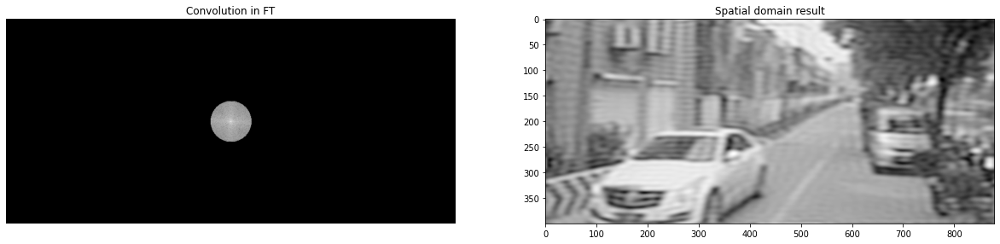

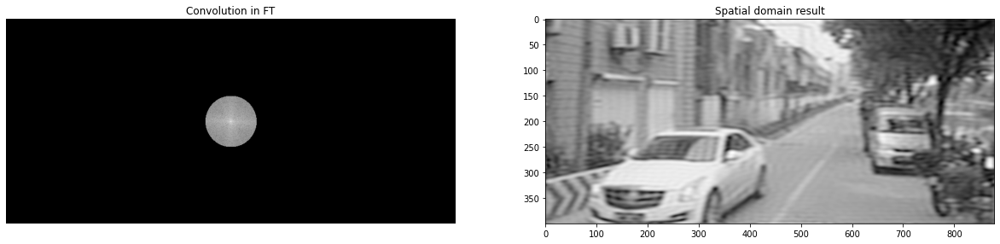

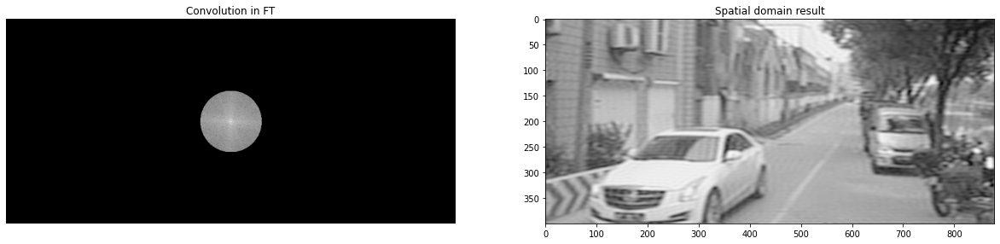

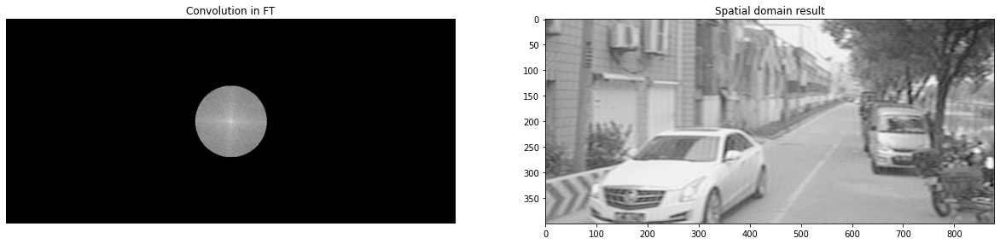

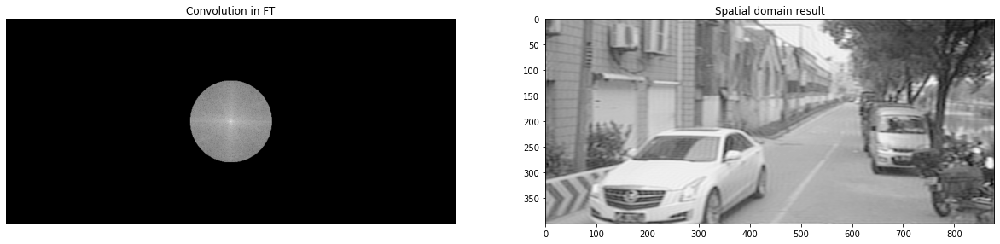

In [ ]:
ilpf, ilp_applied = [], []
for i in range(0,9):
  g, g_spatial = apply_low_pass_filter(ilp_filters[i], img)
  ilpf.append(g)
  ilp_applied.append(g_spatial)

plt.figure(figsize=(30,5))

for i in range(0, 8):
  plt.figure(figsize=(100,5))

  plt.subplot(1,9, 1)
  plt.imshow(np.log1p(np.abs(ilpf[i])),cmap='gray')
  plt.title('Convolution in FT')
  plt.axis('off')

  plt.subplot(1,9,2)

  plt.imshow(np.log1p(np.abs(ilp_applied[i])),cmap='gray')
  plt.title('Spatial domain result')
  plt.axis('on')

plt.show()

In [ ]:
# Assume image is in spatial domain
def apply_high_pass_filter(ihp_filter, image):
  ft = np.fft.fft2(image)
  ft_shifted = np.fft.fftshift(ft)

  g = ft_shifted * ihp_filter

  g_spatial = np.fft.ifftshift(g)
  g_spatial = np.fft.ifft2(g_spatial)

  return g, g_spatial

<Figure size 2160x360 with 0 Axes>

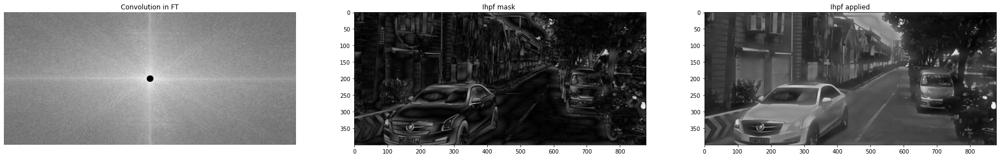

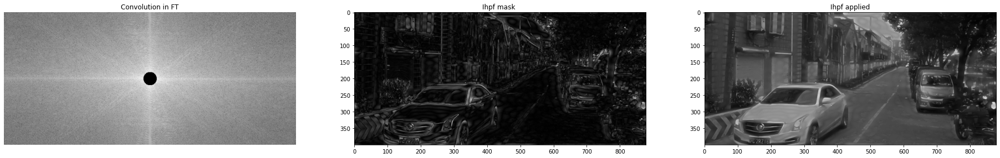

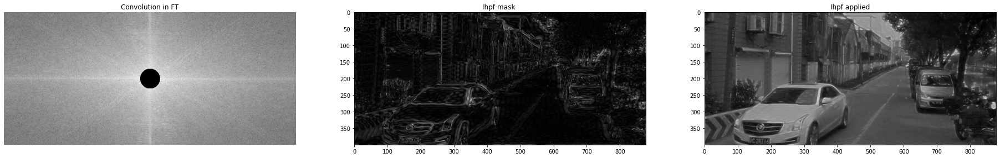

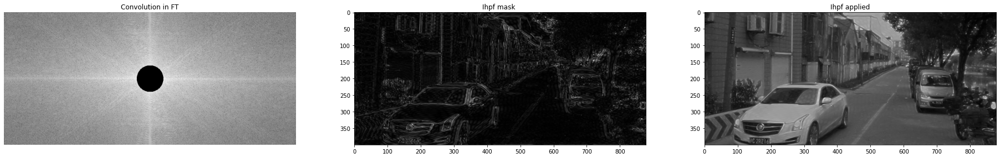

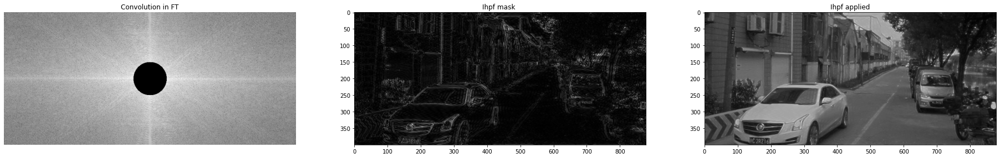

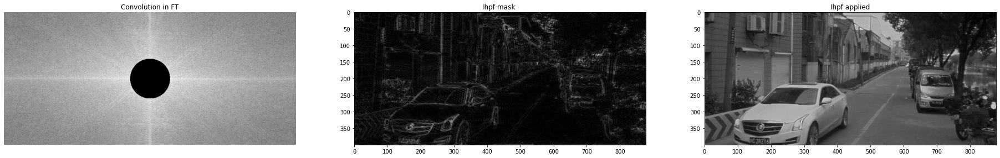

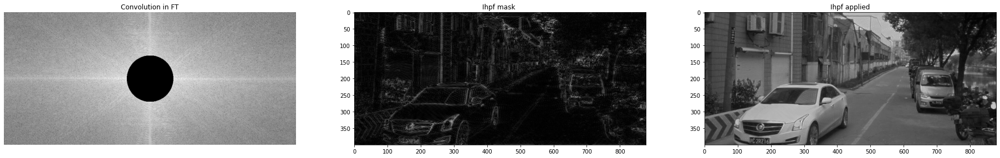

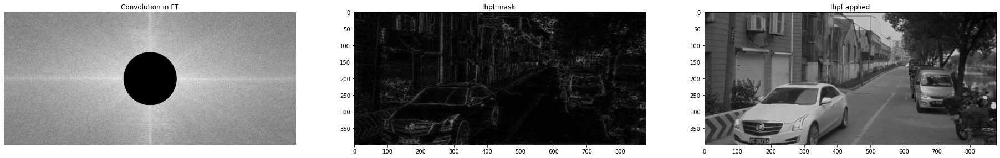

In [ ]:
ihpf, ihp_applied = [], []
for i in range(0,9):
  g, g_spatial = apply_high_pass_filter(ihp_filters[i], img)
  ihpf.append(g)
  ihp_applied.append(g_spatial)

plt.figure(figsize=(30,5))

for i in range(0, 8):
  plt.figure(figsize=(100,5))

  plt.subplot(1,9, 1)
  plt.imshow(np.log1p(np.abs(ihpf[i])),cmap='gray')
  plt.title('Convolution in FT')
  plt.axis('off')

  plt.subplot(1,9,2)

  plt.imshow((np.abs(ihp_applied[i])),cmap='gray')
  plt.title('Ihpf mask ')
  plt.axis('on')

  
  plt.subplot(1,9,3)

  plt.imshow((np.abs(ihp_applied[i])) + img,cmap='gray')
  plt.title('Ihpf applied')
  plt.axis('on')

plt.show()

Why the ringing affect ? 

To visualize this, going from frequency -> spatial domain (just for the filters)

<Figure size 2160x360 with 0 Axes>

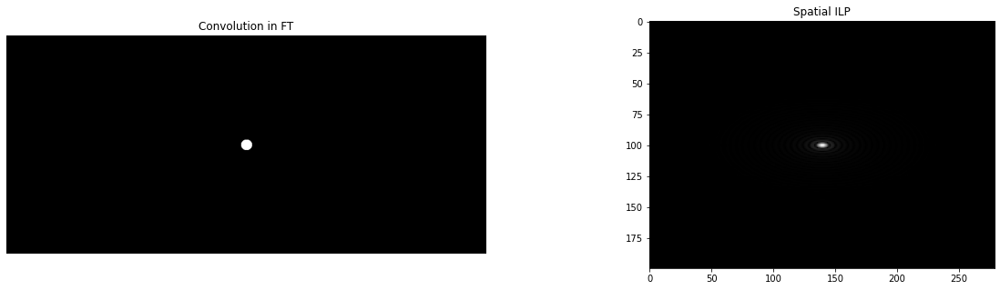

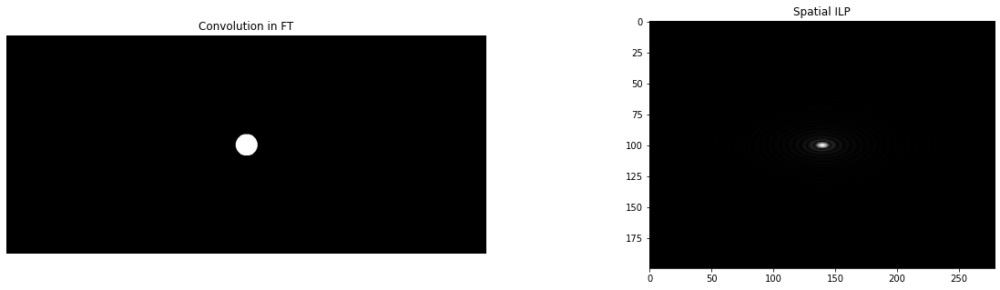

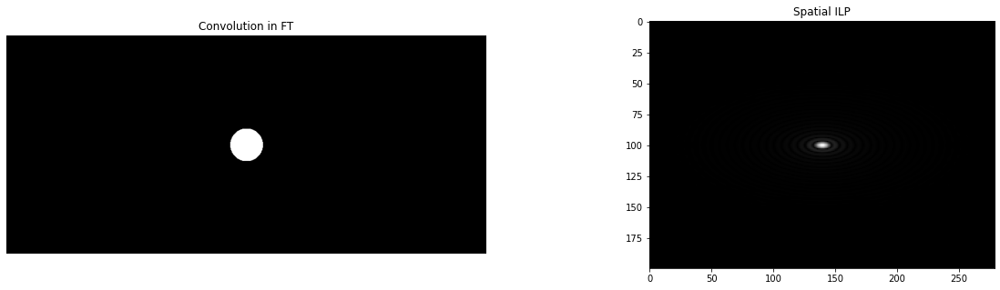

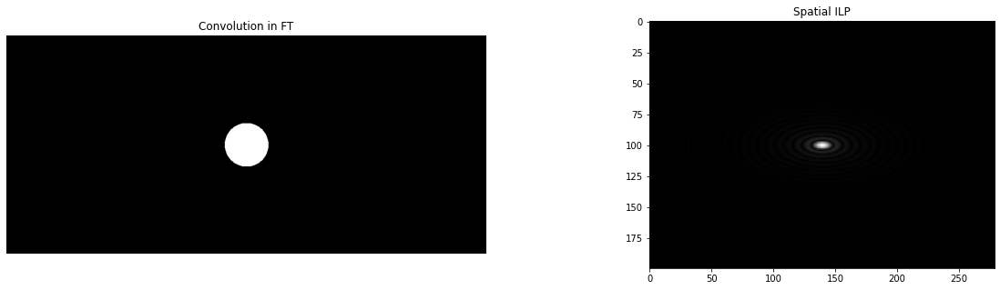

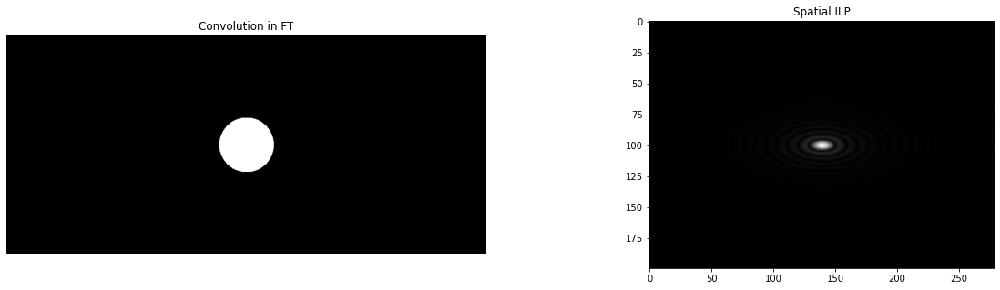

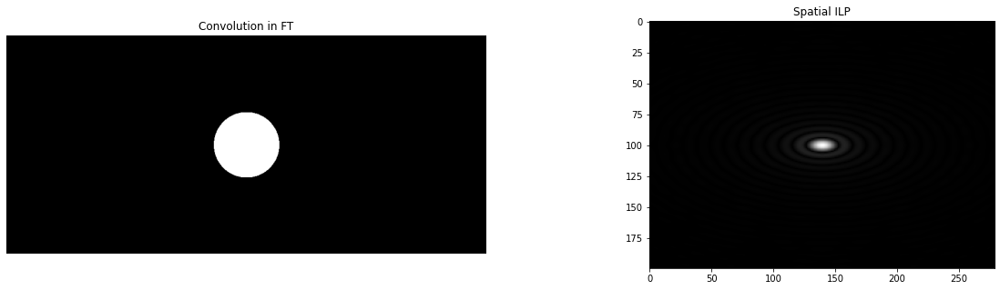

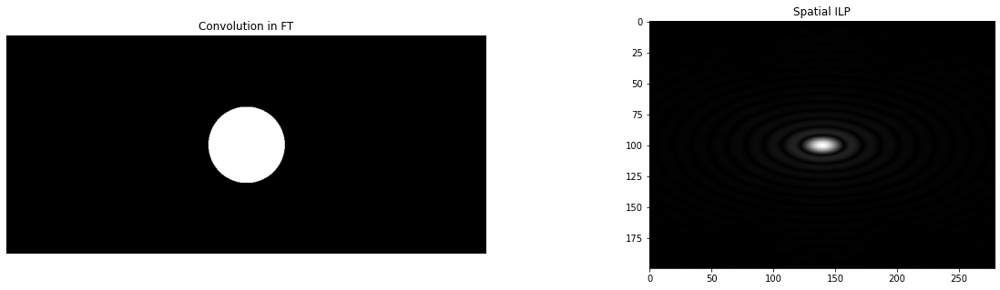

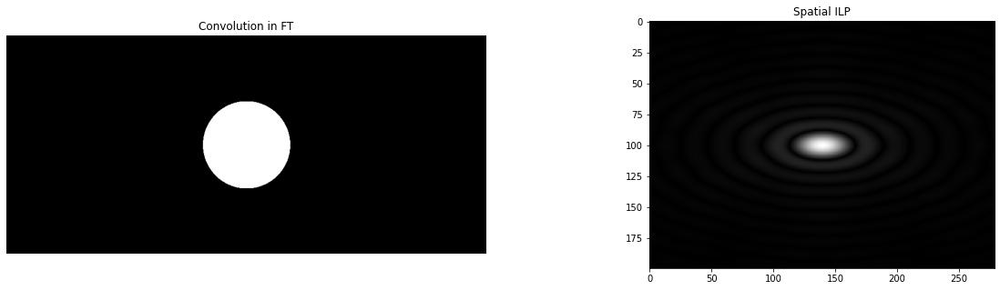

In [ ]:
white_image = np.ones((img.shape[0], img.shape[1]), dtype=np.float32)


ilpf, ilp_applied = [], []
for i in range(0,9):
  g, g_spatial = apply_low_pass_filter(ilp_filters[i], white_image)
  ihpf.append(g)
  ihp_applied.append(g_spatial)

plt.figure(figsize=(30,5))

for i in range(0, 8):
  plt.figure(figsize=(100,5))

  plt.subplot(1,9, 1)
  plt.imshow(np.log1p(np.abs(ilp_filters[i])),cmap='gray')
  plt.title('Convolution in FT')
  plt.axis('off')

  plt.subplot(1,9,2)

  ilp_ift = np.fft.ifftshift(ilp_filters[8-i])
  spatial_ilp = np.fft.fftshift(np.abs(np.fft.ifft2(ilp_ift)))
  plt.imshow((np.log1p(np.abs(spatial_ilp[100:-100,300:-300]))), cmap='gray')

  plt.title('Spatial ILP')
  plt.axis('on')



plt.show()

<Figure size 2160x360 with 0 Axes>

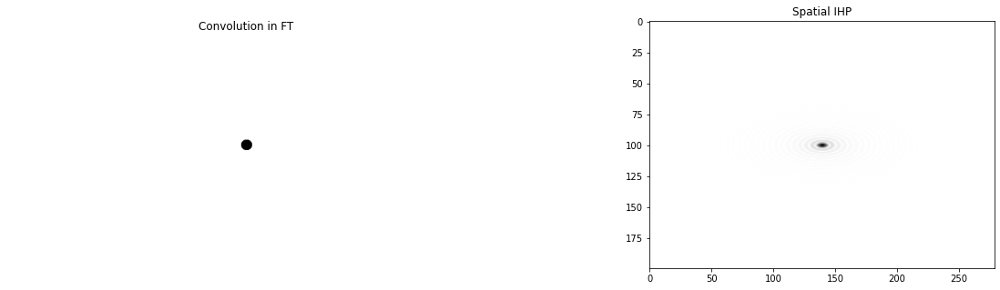

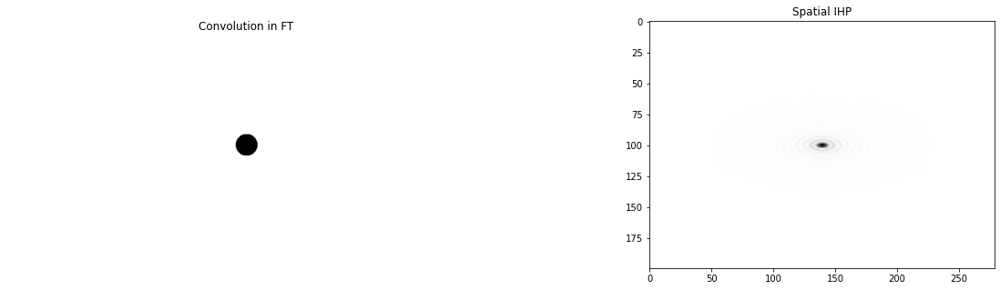

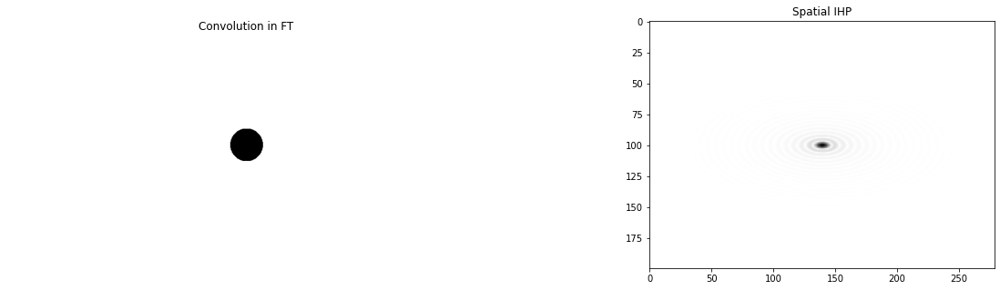

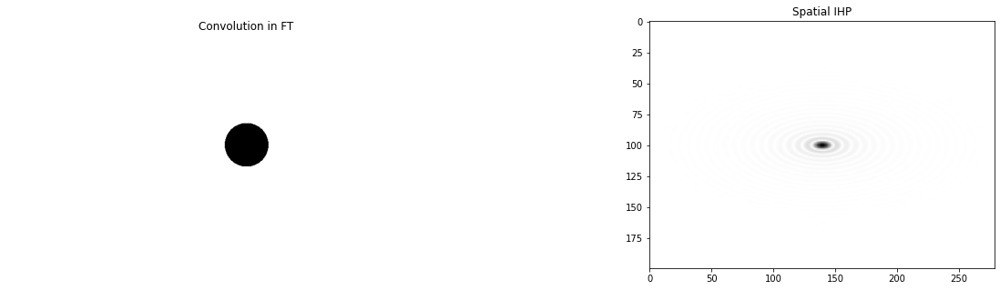

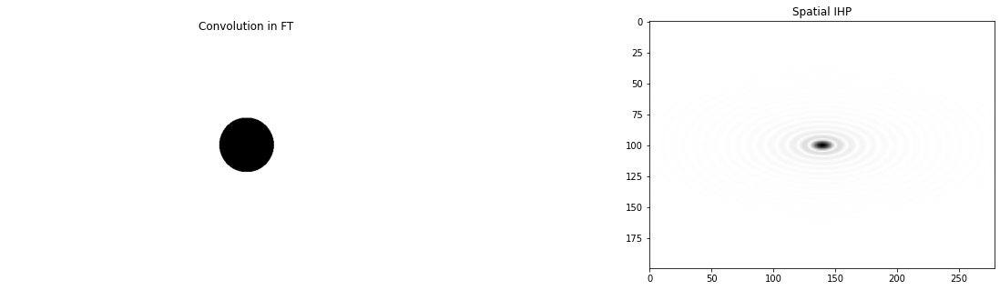

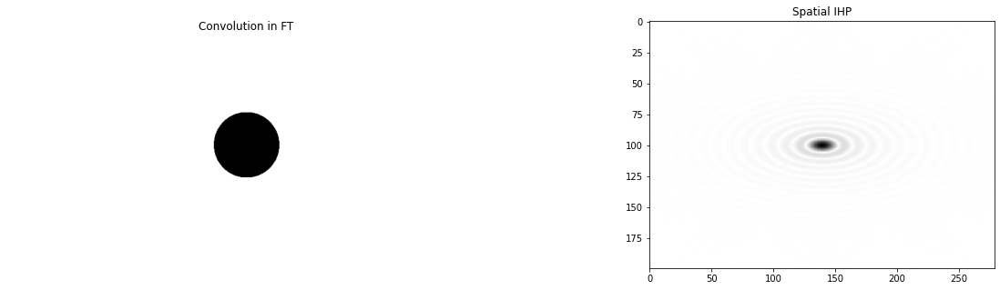

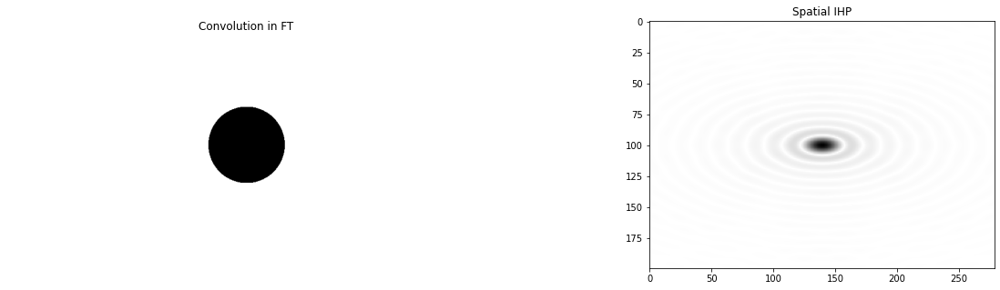

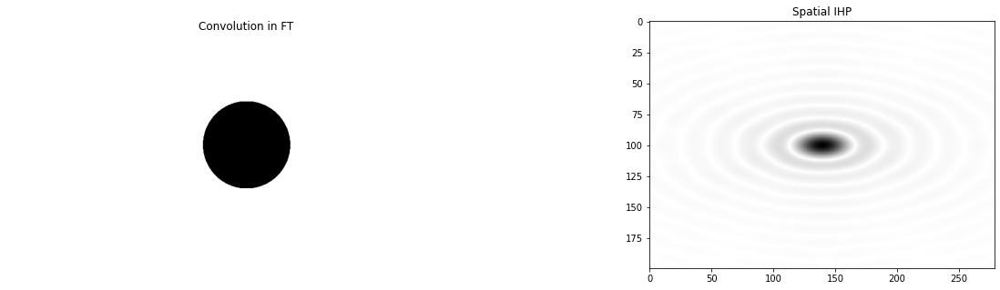

In [ ]:
white_image = np.ones((img.shape[0], img.shape[1]), dtype=np.float32)


ihpf, ihp_applied = [], []
for i in range(0,9):
  g, g_spatial = apply_high_pass_filter(ihp_filters[i], white_image)
  ihpf.append(g)
  ihp_applied.append(g_spatial)

plt.figure(figsize=(30,5))

for i in range(0, 8):
  plt.figure(figsize=(100,5))

  plt.subplot(1,9, 1)
  plt.imshow(np.log1p(np.abs(ihp_filters[i])),cmap='gray')
  plt.title('Convolution in FT')
  plt.axis('off')

  plt.subplot(1,9,2)

  ilp_ift = np.fft.ifftshift(ilp_filters[8-i])
  spatial_ilp = np.fft.fftshift(np.abs(np.fft.ifft2(ilp_ift)))
  plt.imshow((np.log1p(1.0 - np.abs(spatial_ilp[100:-100,300:-300]))), cmap='gray')

  plt.title('Spatial IHP')
  plt.axis('on')



plt.show()

# The Butterworth Low Pass Filter

A frequency domain given by :
H(u, v) = 1 / (1 + (D / D0) ^ n) \
Where, \
D = sqrt((u - m / 2) ** 2 + (v - n / 2) ** 2) \
D0 = cut off frequency \
n = order of filter 

In [179]:
def butter_worth_low_pass(image, d0, order):
  m, n = image.shape
  H = np.zeros((m, n), dtype=np.float64)
  for u in range(m):
    for v in range(n):
      d = np.sqrt((u - m / 2) ** 2 + (v - n / 2) ** 2)
      H[u, v] = 1 / (1 + (d/d0) ** order)

  return H

def butter_worth_high_pass(image, d0, order):
  m, n = image.shape
  H = np.zeros((m, n), dtype=np.float64)
  for u in range(m):
    for v in range(n):
      d = np.sqrt((u - m / 2) ** 2 + (v - n / 2) ** 2)
      H[u, v] = 1 / (1 + (d/d0) ** order)

  return 1 - H

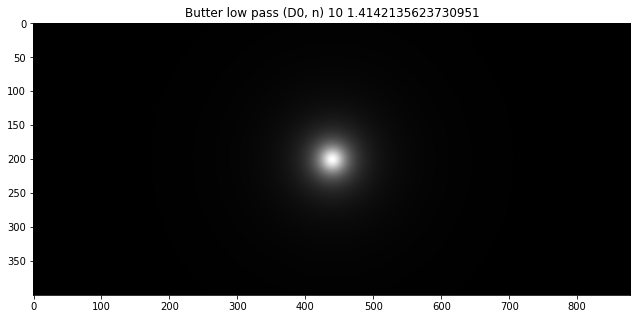

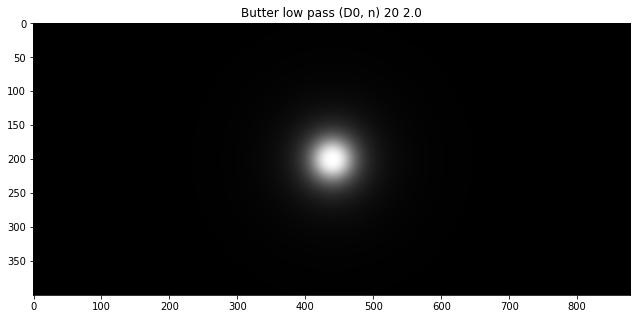

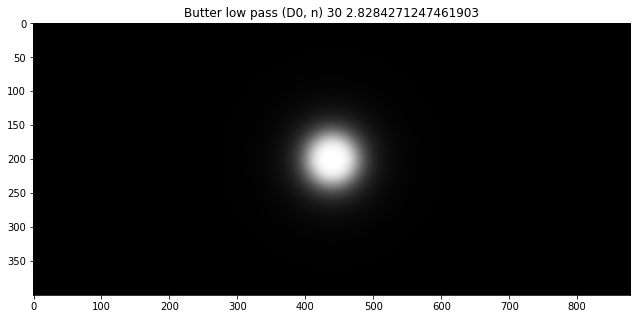

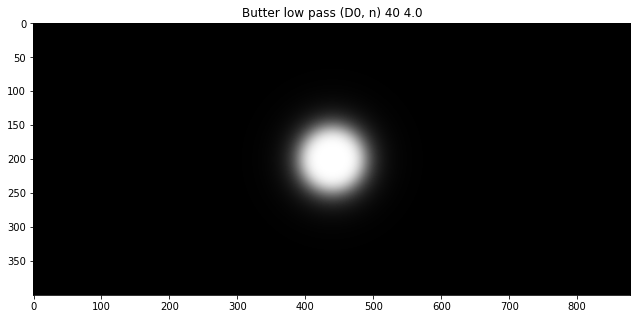

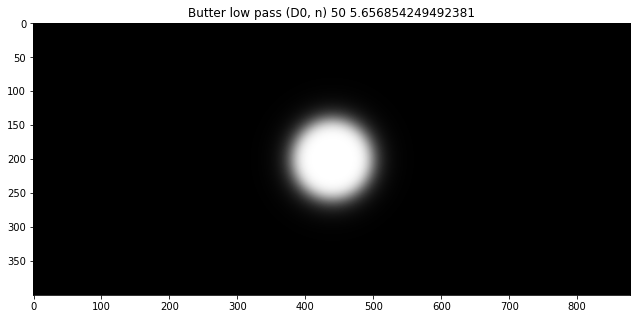

...

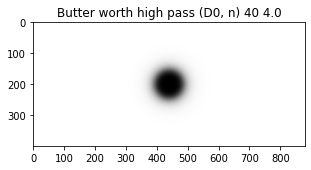

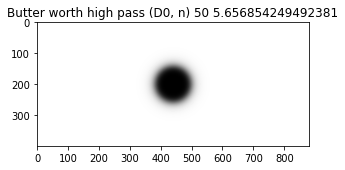

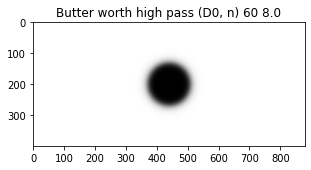

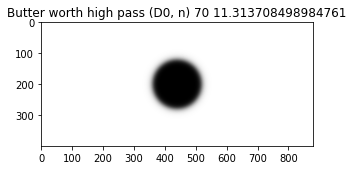

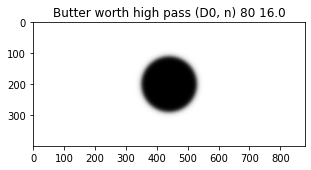

<Figure size 14400x360 with 0 Axes>

In [191]:
butter_worth_low_pass_filters = []
for i in range(1, 10):
  butter_worth_low_pass_filters.append(butter_worth_low_pass(img, i * 10, 2 ** (i/2)))

butter_worth_high_pass_filters = []
for i in range(1, 10):
  butter_worth_high_pass_filters.append(butter_worth_high_pass(img, i * 10, 2 ** (i / 2)))


plt.figure(figsize=(200,5))

for i in range(1, 9):
  plt.subplot(1,10, i)
  plt.imshow(butter_worth_low_pass_filters[i],cmap='gray')
  plt.title(('Butter low pass (D0, n) ' + str(i * 10) + ' ' + str(2 ** (i/2))))
  plt.figure(figsize=(200,5))

  plt.axis('off')

plt.show()

plt.figure(figsize=(200,5))

for i in range(1, 9):
  plt.subplot(2,10, i)
  plt.imshow(butter_worth_high_pass_filters[i],cmap='gray')
  plt.title(('Butter worth high pass (D0, n) ' + str(i * 10) + ' ' + str(2 ** (i/2))))
  plt.axis('on')
  plt.figure(figsize=(200,5))

plt.show()

Applying the butter worth high and low pass filters

In [193]:
# Assume image is in spatial domain
def apply_butter_worth_pass_filter(filter, image):
  ft = np.fft.fft2(image)
  ft_shifted = np.fft.fftshift(ft)

  g = ft_shifted * filter

  g_spatial = np.fft.ifftshift(g)
  g_spatial = np.fft.ifft2(g_spatial)

  return g, g_spatial

Visualize the butter worth filters


<Figure size 2160x360 with 0 Axes>

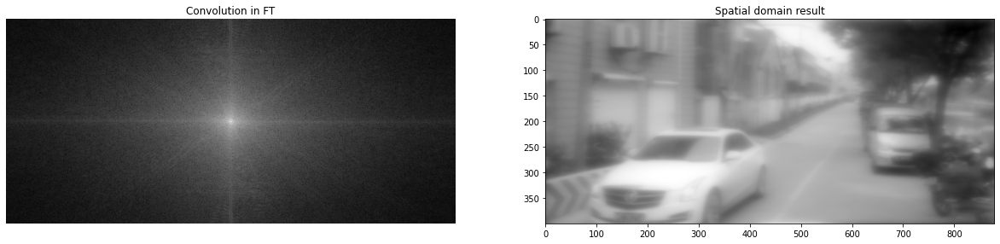

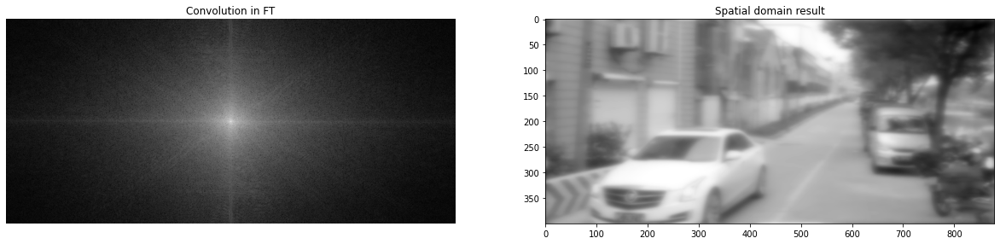

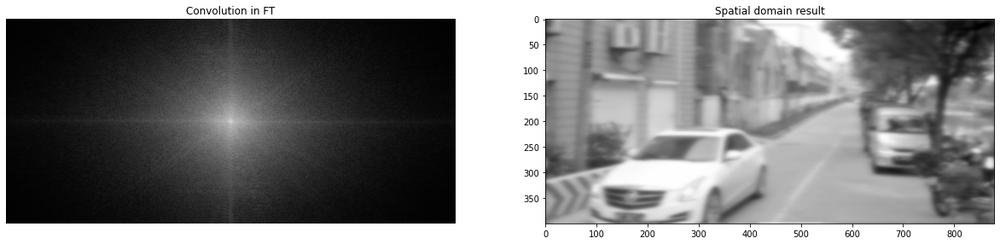

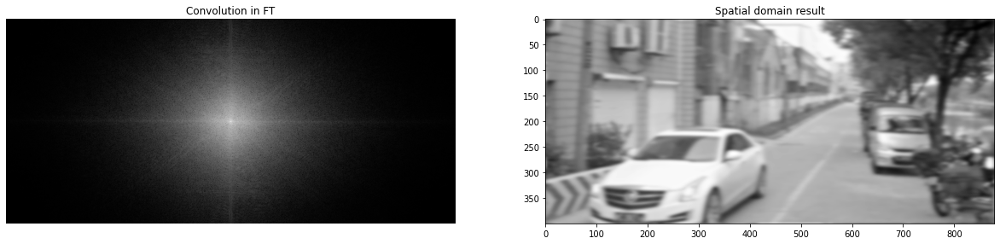

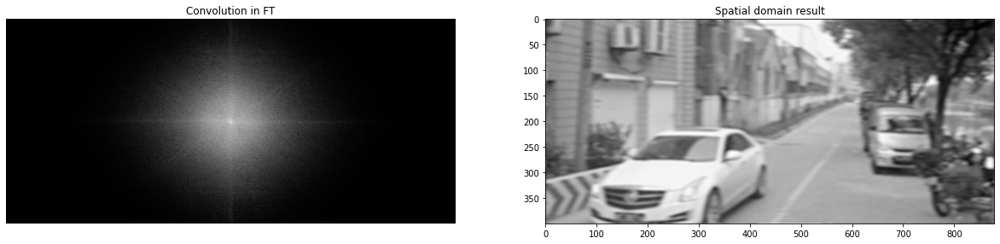

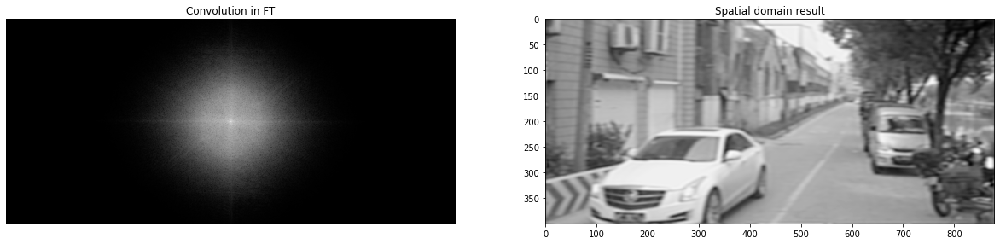

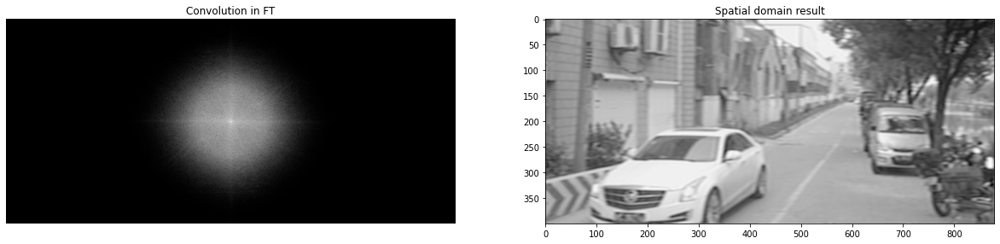

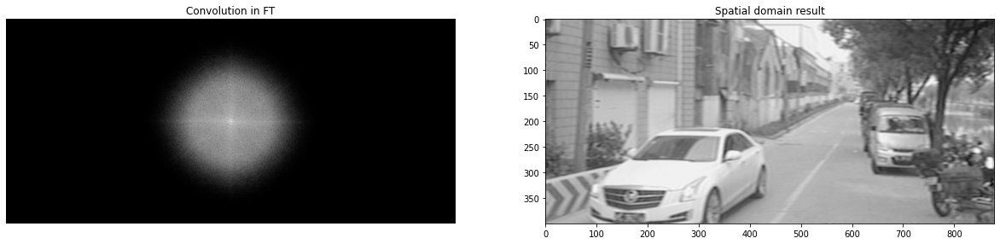

In [202]:
ilpf, ilp_applied = [], []
for i in range(0,9):
  g, g_spatial = apply_butter_worth_pass_filter(butter_worth_low_pass_filters[i], img)
  ilpf.append(g)
  ilp_applied.append(g_spatial)

plt.figure(figsize=(30,5))

for i in range(0, 8):
  plt.figure(figsize=(100,5))

  plt.subplot(1,9, 1)
  plt.imshow(np.log1p(np.abs(ilpf[i])),cmap='gray')
  plt.title('Convolution in FT')
  plt.axis('off')

  plt.subplot(1,9,2)

  plt.imshow(np.log1p(np.abs(ilp_applied[i])),cmap='gray')
  plt.title('Spatial domain result')
  plt.axis('on')

plt.show()

<ipython-input-179-2df6166e4809>:7: RuntimeWarning: overflow encountered in double_scalars
  H[u, v] = 1 / (1 + (d/d0) ** order)


(-0.5, 878.5, 399.5, -0.5)

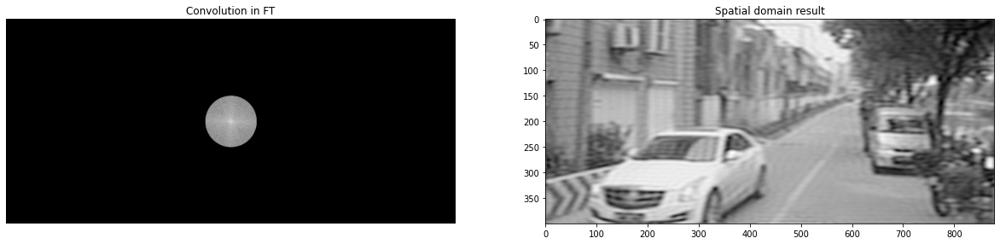

In [209]:
butter_worth_low_pass_filters.append(butter_worth_low_pass(img, 50, 1000))

g, g_spatial = apply_butter_worth_pass_filter(butter_worth_low_pass_filters[-1], img)

plt.figure(figsize=(100,5))

plt.subplot(1,9, 1)
plt.imshow(np.log1p(np.abs(g)),cmap='gray')
plt.title('Convolution in FT')
plt.axis('off')

plt.subplot(1,9,2)

plt.imshow(np.log1p(np.abs(g_spatial)),cmap='gray')
plt.title('Spatial domain result')
plt.axis('on')


<Figure size 2160x360 with 0 Axes>

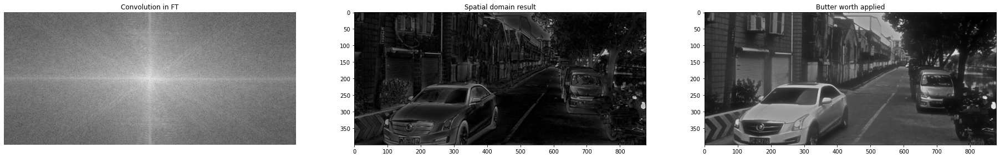

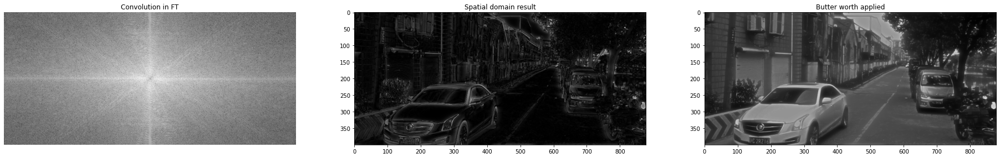

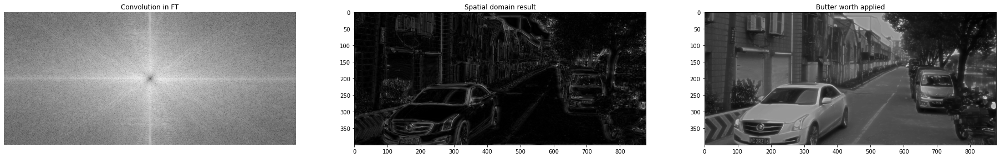

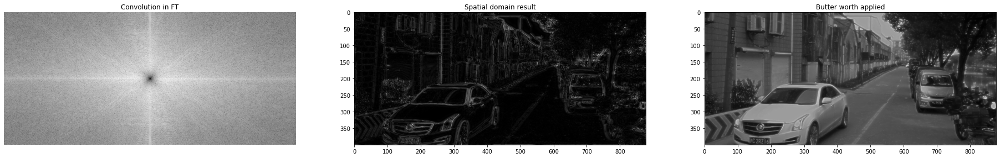

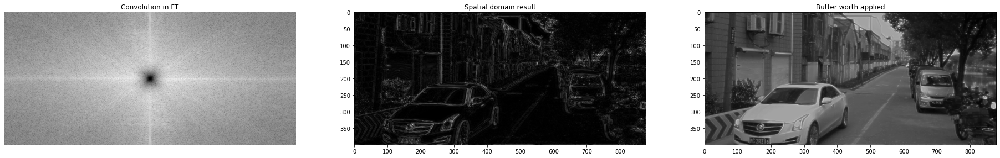

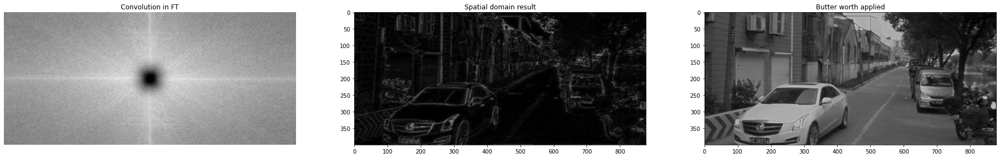

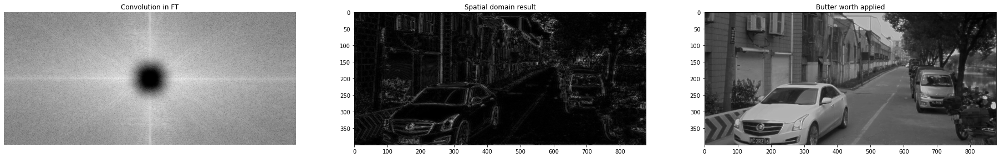

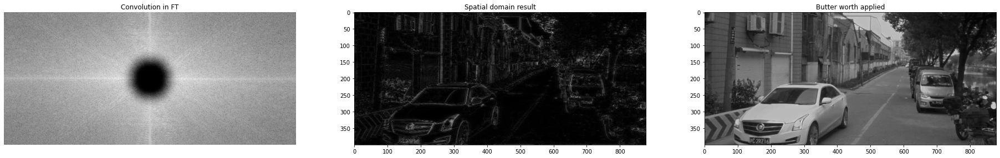

In [201]:
ihpf, ihp_applied = [], []
for i in range(0,9):
  g, g_spatial = apply_butter_worth_pass_filter(butter_worth_high_pass_filters[i], img)
  ihpf.append(g)
  ihp_applied.append(g_spatial)

plt.figure(figsize=(30,5))

for i in range(0, 8):
  plt.figure(figsize=(100,5))

  plt.subplot(1,9, 1)
  plt.imshow(np.log1p(np.abs(ihpf[i])),cmap='gray')
  plt.title('Convolution in FT')
  plt.axis('off')

  plt.subplot(1,9,2)

  plt.imshow((np.abs(ihp_applied[i])),cmap='gray')
  plt.title('Spatial domain result')
  plt.axis('on')

  plt.subplot(1,9,3)

  plt.imshow((np.abs(ihp_applied[i])) + img,cmap='gray')
  plt.title('Butter worth applied')
  plt.axis('on')


plt.show()

Morphological Transformations

Broad set of image processing operations that processes binary images based on SE (Structuring elements) which dictates the nature of the operation.

Each pixel in image is adjusted based on value of pixels in its neighbourhood.

Erosion

Pixel will be considered 255 or 0 only if ALL pixels under the kernel is 255 or 0. OTherwise it is eroded (i.e color changes to 0 or 255)



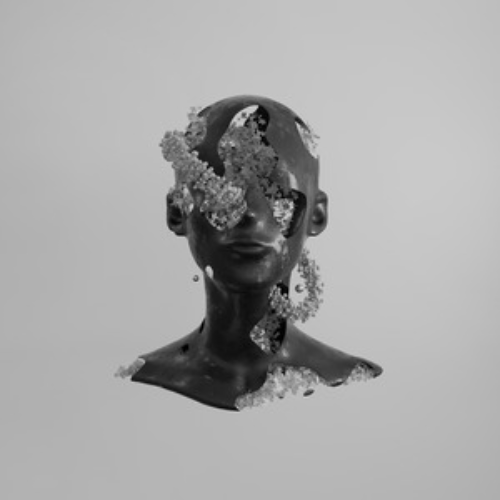

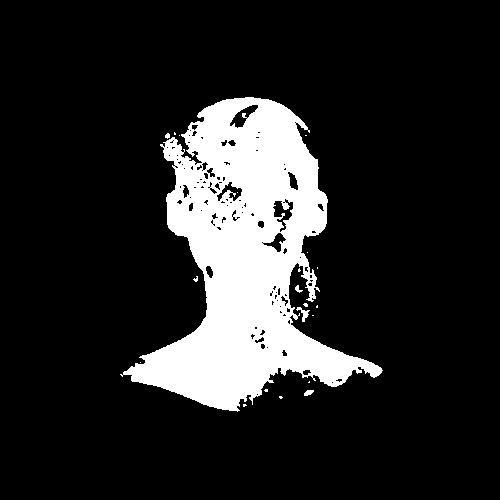

[[1 1 1]
 [1 1 1]
 [1 1 1]]


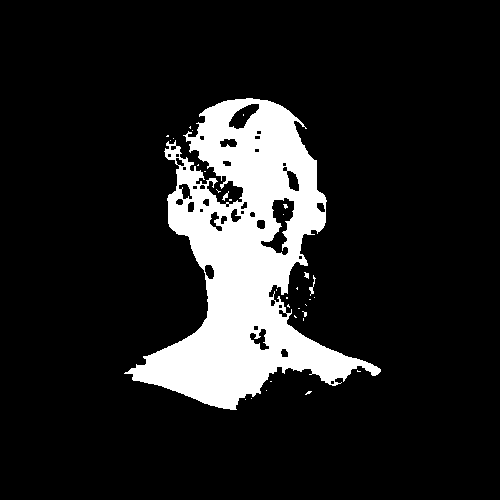

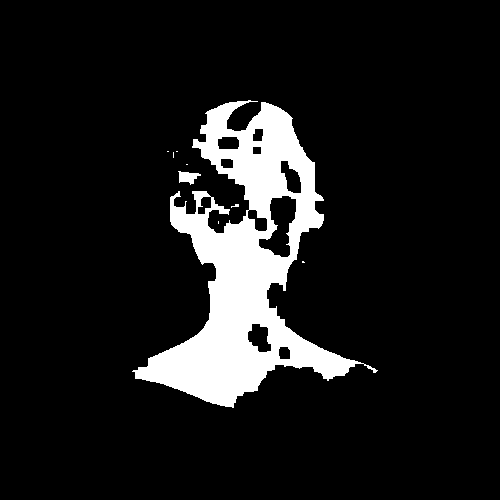

In [ ]:
cv2_imshow(img)

ret, binary_image = cv2.threshold(img, 125, 255, cv2.THRESH_BINARY_INV)
cv2_imshow(binary_image)

se = np.ones((3, 3), dtype=np.uint8)
print(se)

erosion = cv2.erode(binary_image, se, iterations=1)
cv2_imshow(erosion)

erosion = cv2.erode(binary_image, se, iterations=3)
cv2_imshow(erosion)

Dilation

Pixel will be made to be 255 even if only one pixel is covered / is under the SE.

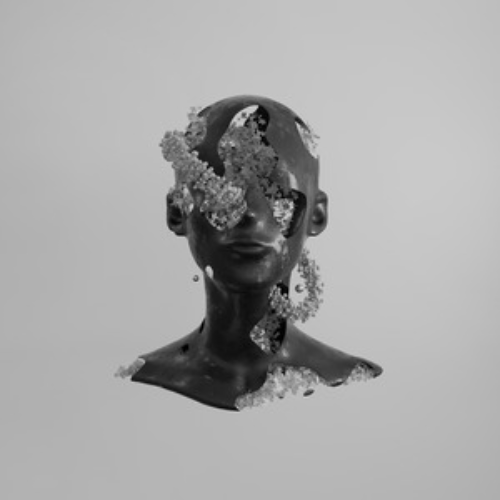

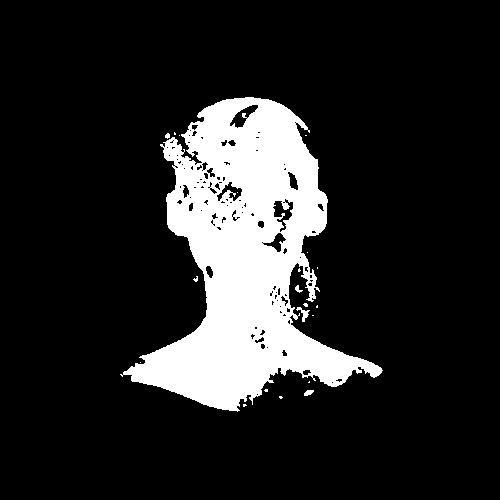

[[1 1 1]
 [1 1 1]
 [1 1 1]]


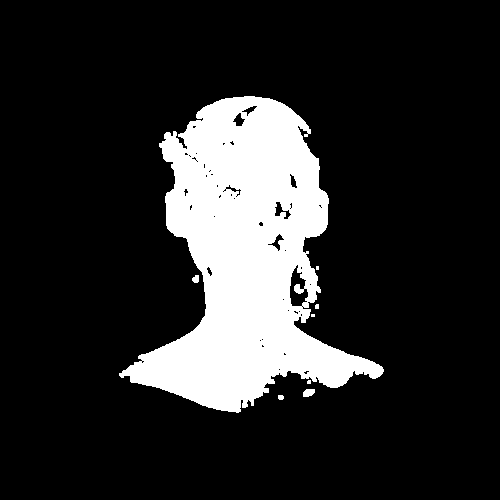

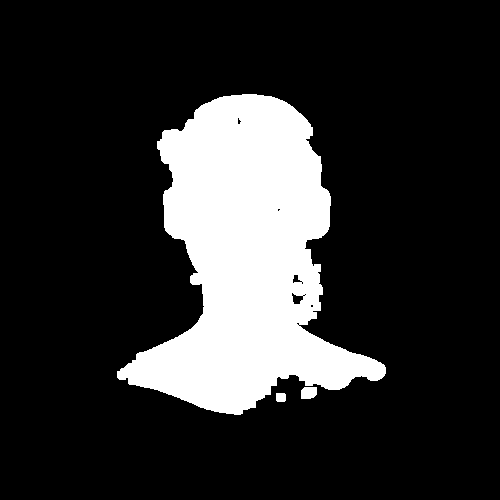

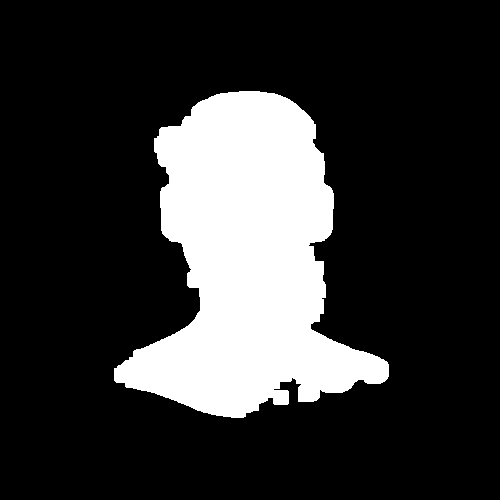

In [ ]:
cv2_imshow(img)

ret, binary_image = cv2.threshold(img, 125, 255, cv2.THRESH_BINARY_INV)
cv2_imshow(binary_image)

se = np.ones((3, 3), dtype=np.uint8)
print(se)

dilation = cv2.dilate(binary_image, se, iterations=1)
cv2_imshow(dilation)

dilation = cv2.dilate(binary_image, se, iterations=3)
cv2_imshow(dilation)

dilation = cv2.dilate(binary_image, se, iterations=6)
cv2_imshow(dilation)
